# GPU BPF / APF / IMM — Filtered Output Visualization

Load CSV from `test_bpf_matched_dgp --csv bpf_output.csv` and plot filtered vs true log-volatility.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

plt.style.use('dark_background')  # or 'seaborn-v0_8-whitegrid'
plt.rcParams['figure.figsize'] = (16, 5)
plt.rcParams['figure.dpi'] = 120

CSV_PATH = 'bpf_output.csv'  # adjust path
df = pd.read_csv(CSV_PATH)
print(f'Loaded {len(df)} rows, scenarios: {df.scenario_name.unique()}')
df.head()

Loaded 40000 rows, scenarios: ['Baseline (G/t5)' 'Student-t (t5/t5)' 'High Persist' 'High Vol-of-Vol'
 'Low Vol' 'High Vol' 'Fast Revert' 'Pure Gaussian']


,tick,scenario_id,scenario_name,true_h,true_vol,return,bpf_h,bpf_loglik,apf_h,apf_loglik,imm_h,imm_best_model,imm_best_prob,ewma_h,garch_h
0,0,1,Baseline (G/t5),-3.869162,0.144485,0.306918,-4.084718,-1.523358,-4.095369,-1.533840,0.0,-1,0.0,-4.056184,-3.814510
1,1,1,Baseline (G/t5),-3.791914,0.150175,0.063189,-4.198663,0.935958,-4.208151,-0.000561,0.0,-1,0.0,-3.819991,-3.581981
2,2,1,Baseline (G/t5),-3.870229,0.144408,0.014068,-4.355514,1.162566,-4.363255,0.002924,0.0,-1,0.0,-3.870311,-3.657424
3,3,1,Baseline (G/t5),-4.060481,0.131304,-0.019392,-4.504700,1.225698,-4.513140,0.002592,0.0,-1,0.0,-3.931581,-3.743302
4,4,1,Baseline (G/t5),-4.132217,0.126678,0.261221,-4.214431,-1.060539,-4.223971,0.003022,0.0,-1,0.0,-3.992233,-3.826796


In [3]:
def plot_scenario(df, scenario_id=1, t_start=0, t_end=None):
    """Plot true h vs all filter estimates for a single scenario."""
    d = df[df.scenario_id == scenario_id].copy()
    if t_end:
        d = d[(d.tick >= t_start) & (d.tick < t_end)]
    else:
        d = d[d.tick >= t_start]
    
    name = d.scenario_name.iloc[0]
    t = d.tick.values
    
    fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)
    
    # --- Panel 1: Log-vol estimates ---
    ax = axes[0]
    ax.plot(t, d.true_h, 'w-', alpha=0.5, lw=0.8, label='True h(t)')
    ax.plot(t, d.bpf_h, '#00bfff', lw=0.9, alpha=0.85, label='BPF')
    ax.plot(t, d.apf_h, '#ff6b6b', lw=0.9, alpha=0.85, label='APF')
    ax.plot(t, d.imm_h, '#50fa7b', lw=0.9, alpha=0.75, label='IMM')
    ax.set_ylabel('Log-Volatility h(t)')
    ax.set_title(f'{name} — Particle Filter vs Truth', fontsize=13)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, alpha=0.2)
    
    # --- Panel 2: Classical baselines ---
    ax = axes[1]
    ax.plot(t, d.true_h, 'w-', alpha=0.5, lw=0.8, label='True h(t)')
    ax.plot(t, d.ewma_h, '#ffa500', lw=0.9, alpha=0.85, label='EWMA(0.94)')
    ax.plot(t, d.garch_h, '#da70d6', lw=0.9, alpha=0.85, label='GARCH(1,1)')
    ax.plot(t, d.bpf_h, '#00bfff', lw=0.7, alpha=0.5, label='BPF (ref)')
    ax.set_ylabel('Log-Volatility h(t)')
    ax.set_title(f'{name} — Classical vs Particle Filter', fontsize=13)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, alpha=0.2)
    
    # --- Panel 3: Tracking error ---
    ax = axes[2]
    ax.plot(t, d.bpf_h - d.true_h, '#00bfff', lw=0.7, alpha=0.8, label='BPF err')
    ax.plot(t, d.ewma_h - d.true_h, '#ffa500', lw=0.7, alpha=0.6, label='EWMA err')
    ax.axhline(0, color='w', lw=0.5, alpha=0.3)
    ax.set_ylabel('Tracking Error')
    ax.set_xlabel('Tick')
    ax.set_title(f'{name} — Tracking Error (filter - true)', fontsize=13)
    ax.legend(loc='upper right', fontsize=9)
    ax.grid(True, alpha=0.2)
    
    plt.tight_layout()
    return fig

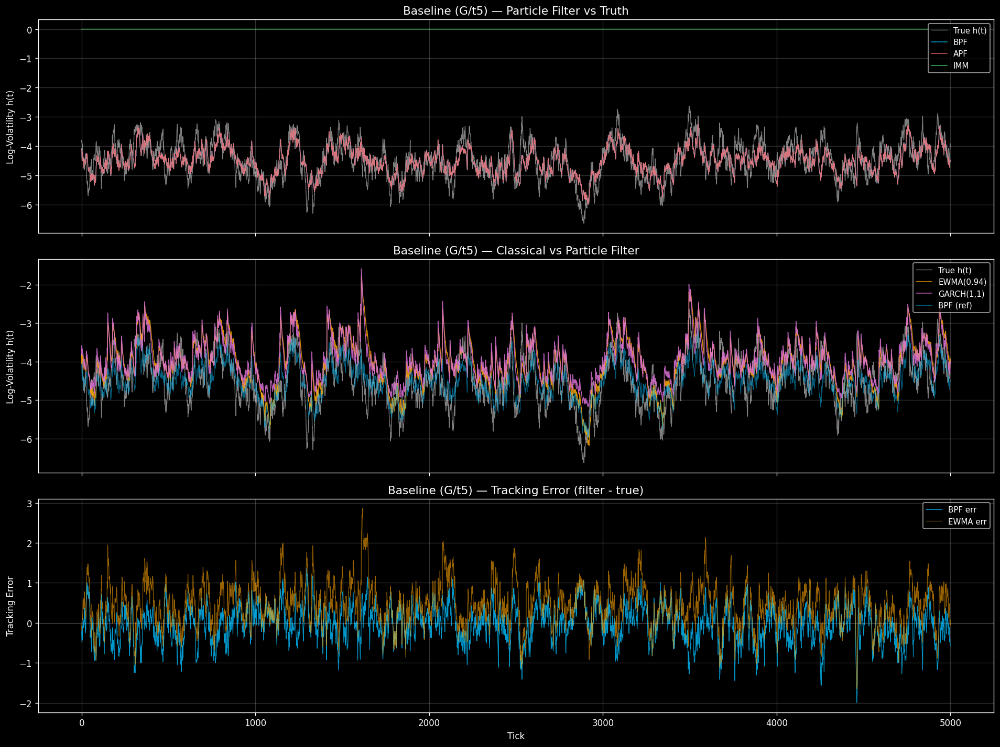

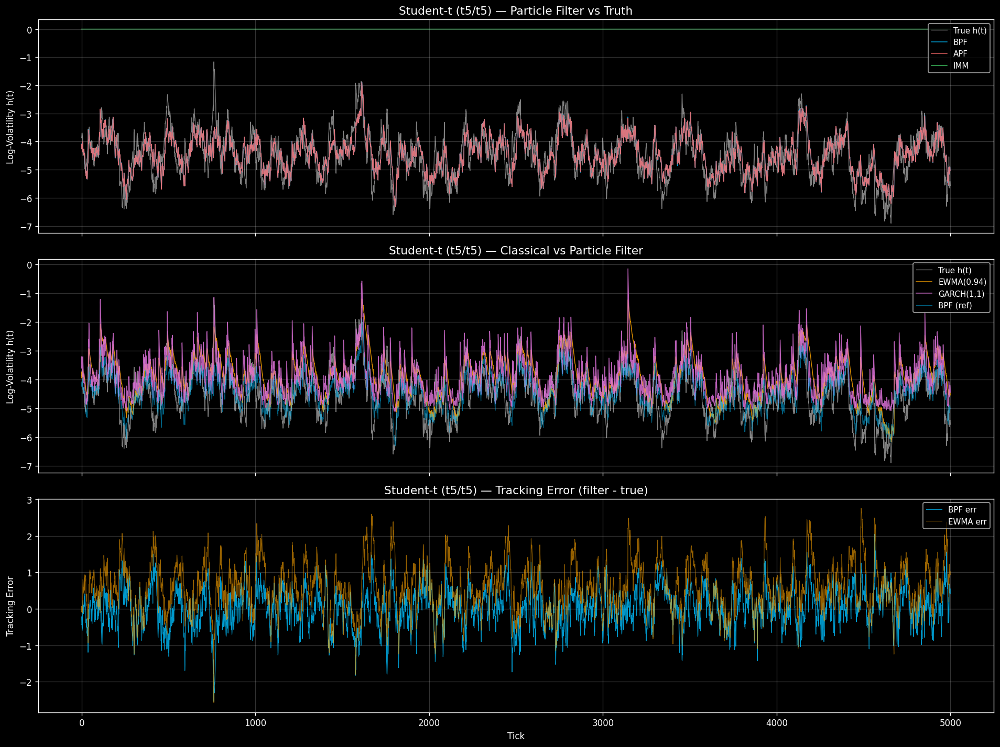

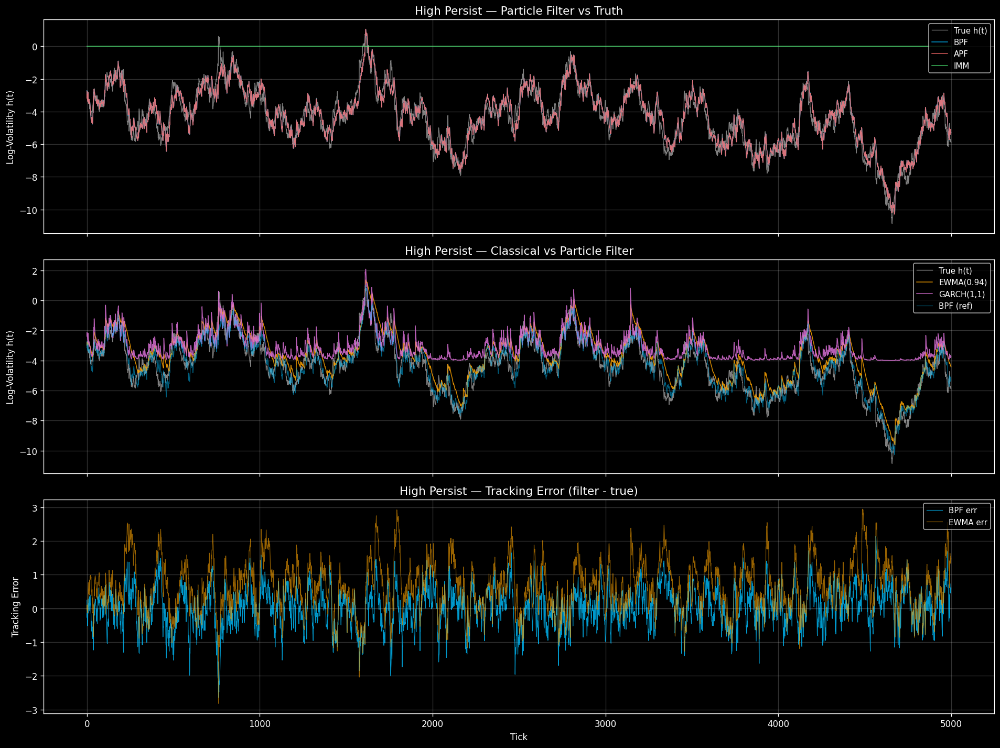

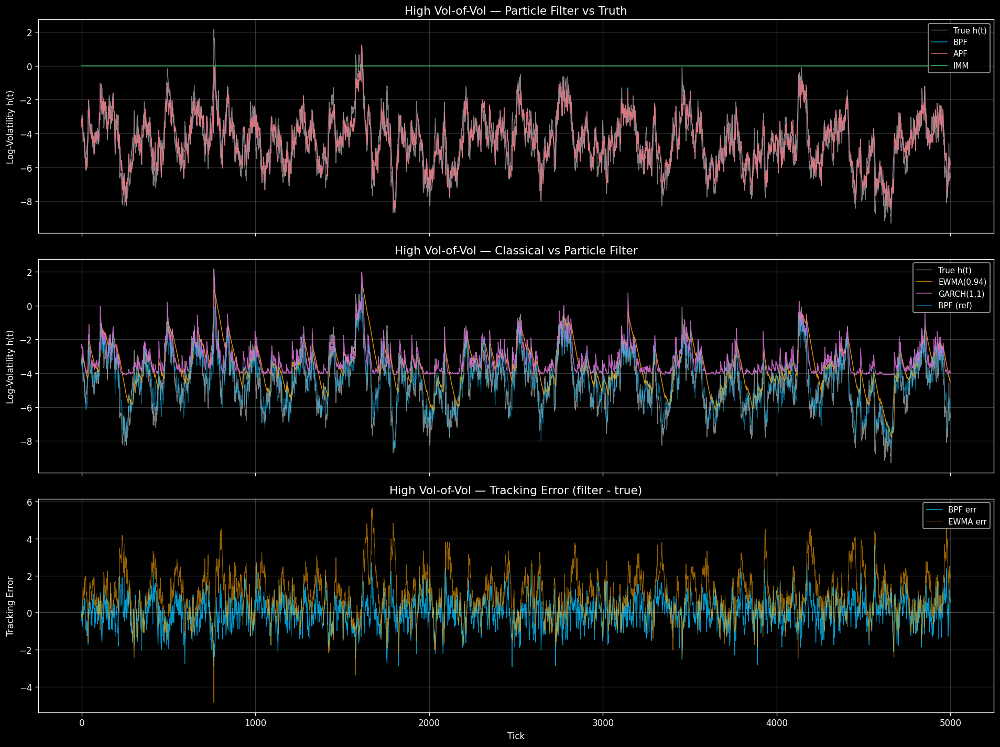

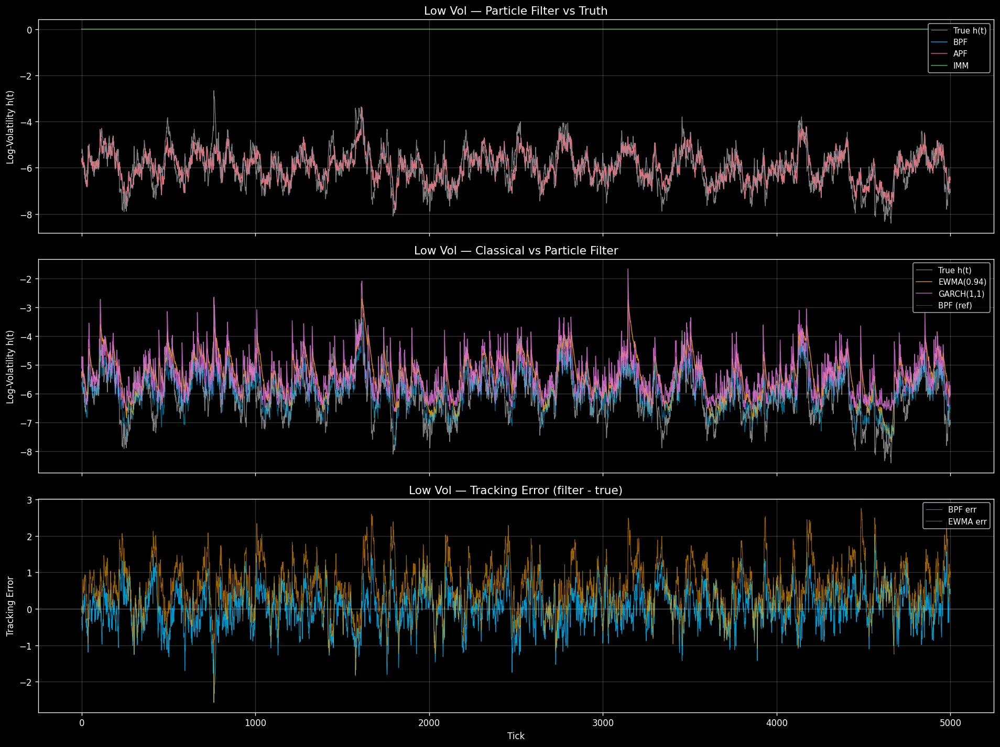

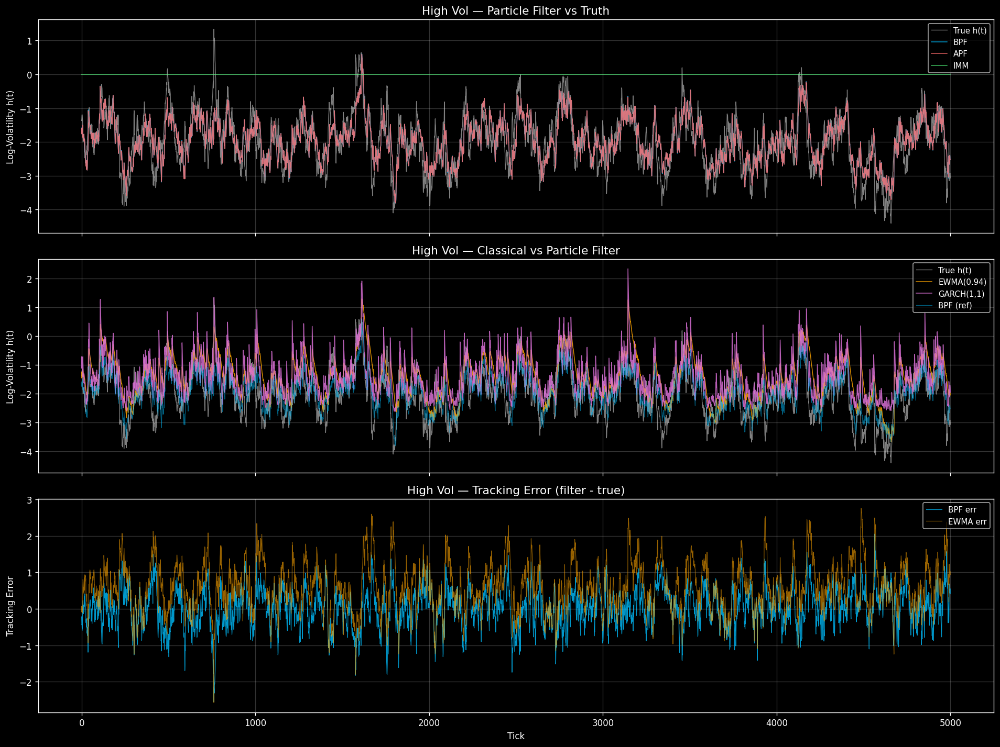

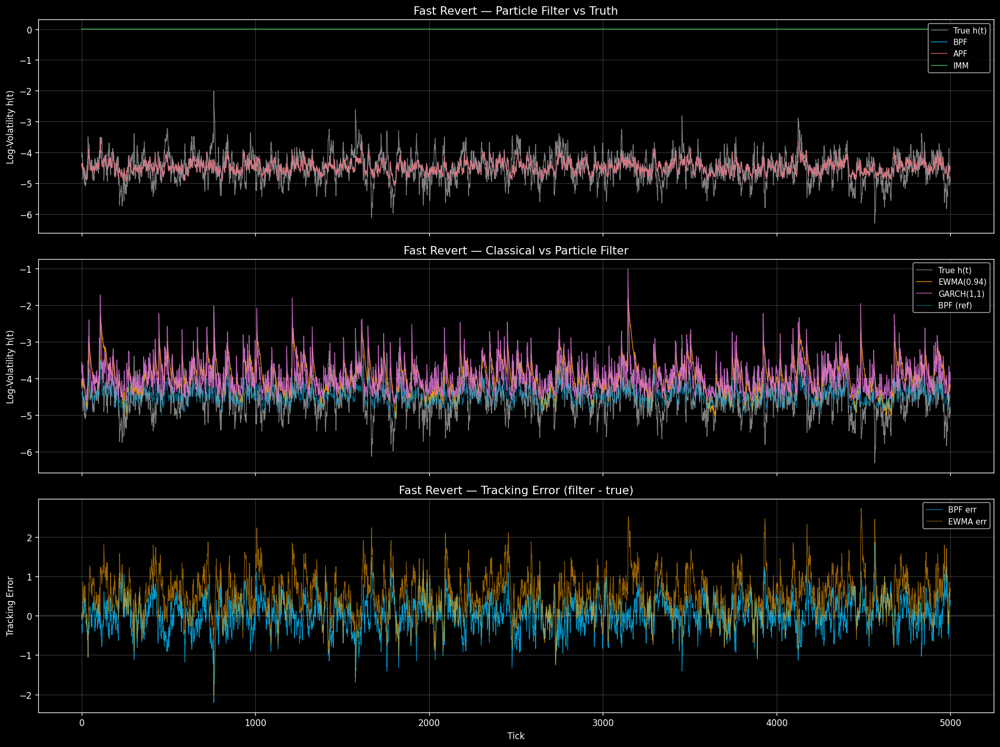

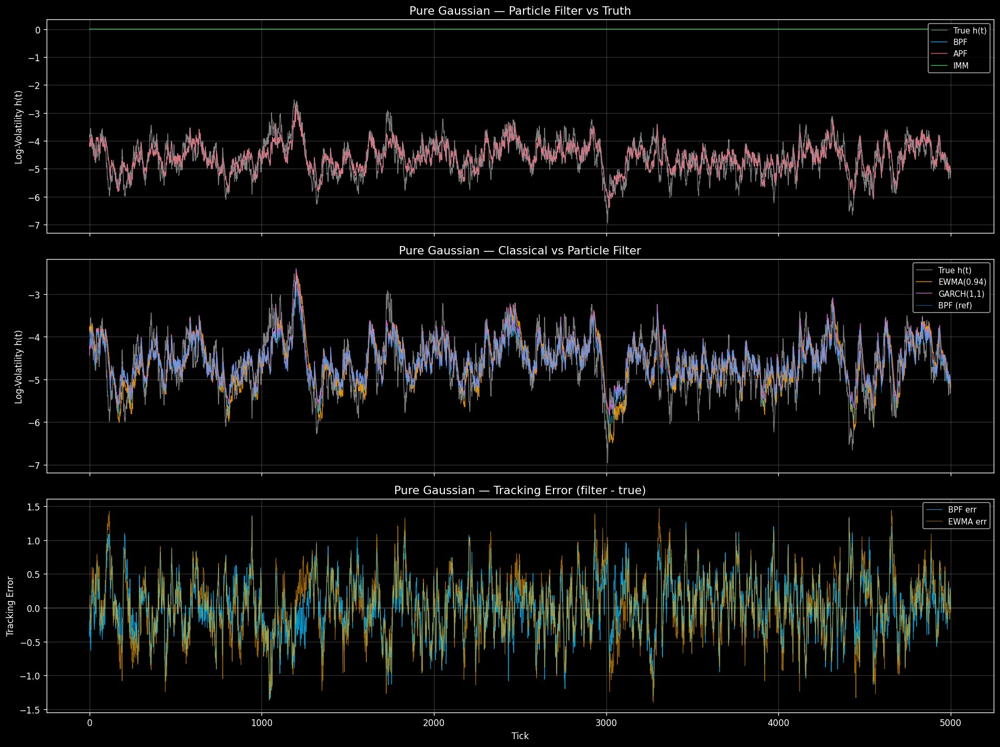

In [4]:
# Plot each scenario
for sid in sorted(df.scenario_id.unique()):
    plot_scenario(df, scenario_id=sid)
    plt.show()

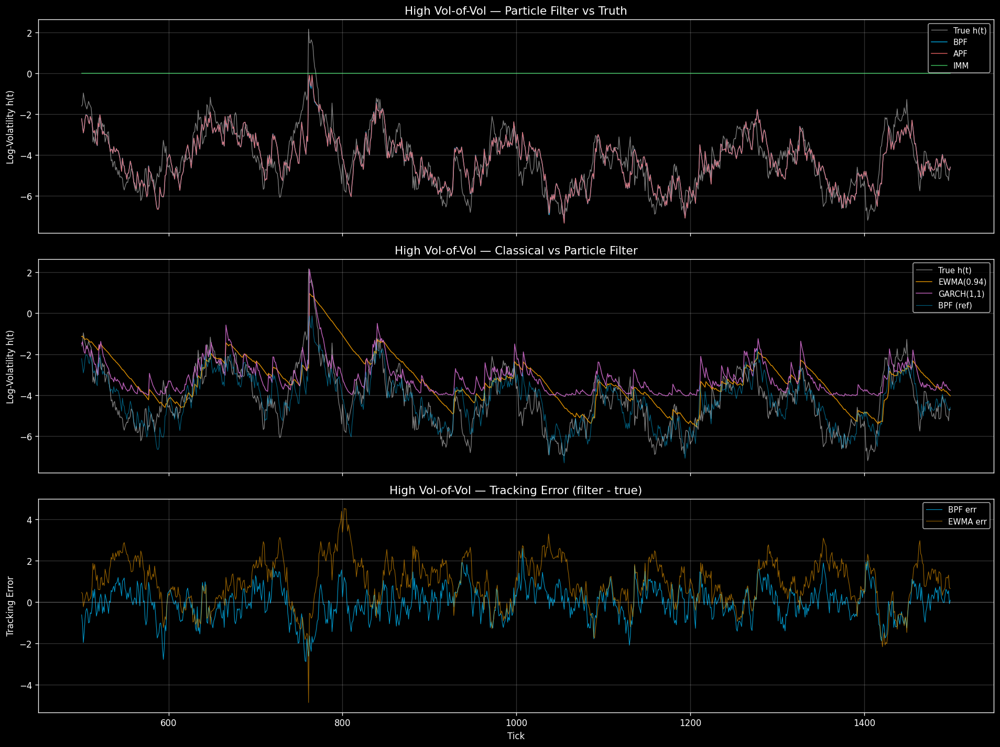

In [5]:
# Zoom into a volatile region (adjust scenario + range)
plot_scenario(df, scenario_id=4, t_start=500, t_end=1500)  # High Vol-of-Vol
plt.show()

In [6]:
def rmse_table(df, skip=100):
    """Compute per-scenario RMSE for all filters."""
    rows = []
    for sid, g in df[df.tick >= skip].groupby('scenario_id'):
        name = g.scenario_name.iloc[0]
        true_h = g.true_h.values
        rows.append({
            'scenario': name,
            'BPF': np.sqrt(np.mean((g.bpf_h.values - true_h)**2)),
            'APF': np.sqrt(np.mean((g.apf_h.values - true_h)**2)),
            'IMM': np.sqrt(np.mean((g.imm_h.values - true_h)**2)),
            'EWMA': np.sqrt(np.mean((g.ewma_h.values - true_h)**2)),
            'GARCH': np.sqrt(np.mean((g.garch_h.values - true_h)**2)),
        })
    return pd.DataFrame(rows).set_index('scenario')

rmse_table(df).style.format('{:.4f}').background_gradient(axis=1, cmap='RdYlGn_r')

,BPF,APF,IMM,EWMA,GARCH
scenario,,,,,
Baseline (G/t5),0.4437,0.4440,4.5046,0.6997,0.7123
Student-t (t5/t5),0.5308,0.5310,4.5519,0.8826,0.8428
High Persist,0.5867,0.5866,4.6638,0.9789,1.6969
High Vol-of-Vol,0.7813,0.7804,4.7473,1.5393,1.6759
Low Vol,0.5309,0.5308,6.0333,0.8826,0.8428
High Vol,0.5308,0.5307,2.1408,0.8826,0.8428
Fast Revert,0.4108,0.4109,4.5181,0.7521,0.7295
Pure Gaussian,0.4081,0.4081,4.6693,0.4645,0.4309


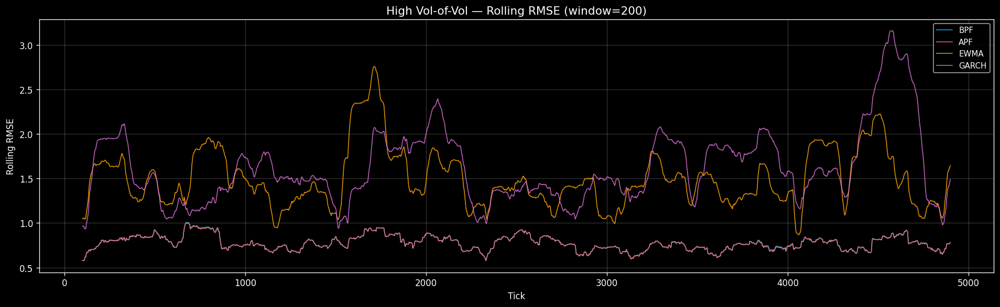

In [7]:
def plot_rolling_rmse(df, scenario_id=1, window=200):
    """Rolling RMSE to see where filters struggle."""
    d = df[df.scenario_id == scenario_id].copy()
    name = d.scenario_name.iloc[0]
    
    for col, label, color in [
        ('bpf_h', 'BPF', '#00bfff'),
        ('apf_h', 'APF', '#ff6b6b'),
        ('ewma_h', 'EWMA', '#ffa500'),
        ('garch_h', 'GARCH', '#da70d6'),
    ]:
        err2 = (d[col] - d.true_h)**2
        rmse = np.sqrt(err2.rolling(window, center=True).mean())
        plt.plot(d.tick.values, rmse, color=color, lw=1, alpha=0.85, label=label)
    
    plt.title(f'{name} — Rolling RMSE (window={window})', fontsize=13)
    plt.xlabel('Tick')
    plt.ylabel('Rolling RMSE')
    plt.legend(fontsize=9)
    plt.grid(True, alpha=0.2)
    plt.tight_layout()

plot_rolling_rmse(df, scenario_id=4)  # High Vol-of-Vol
plt.show()

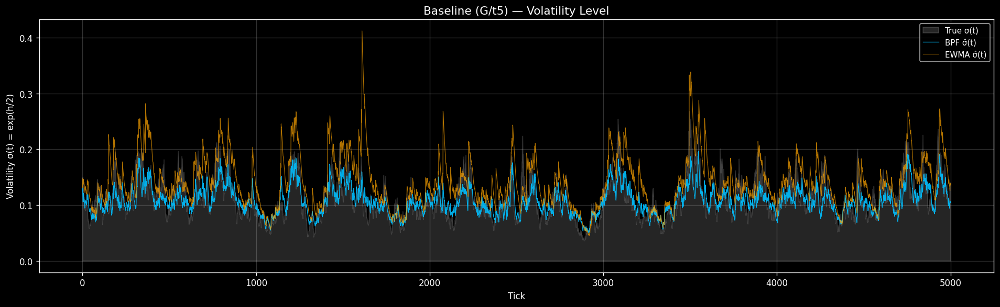

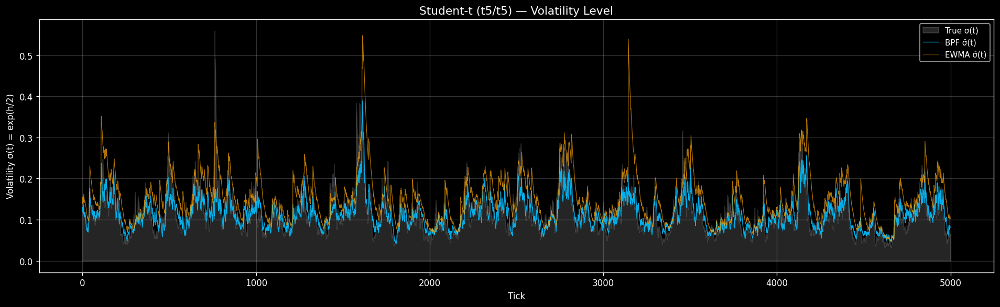

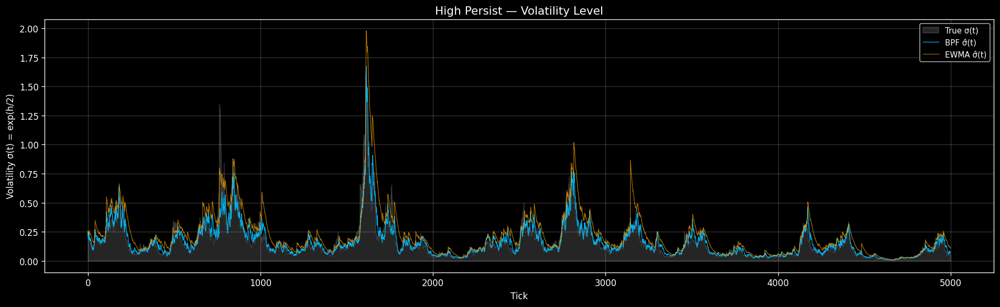

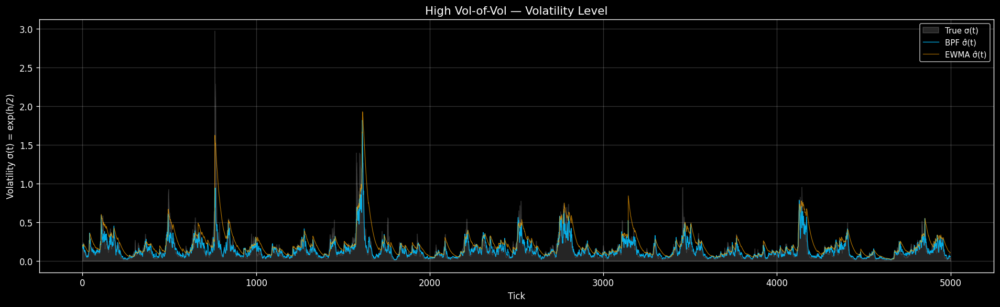

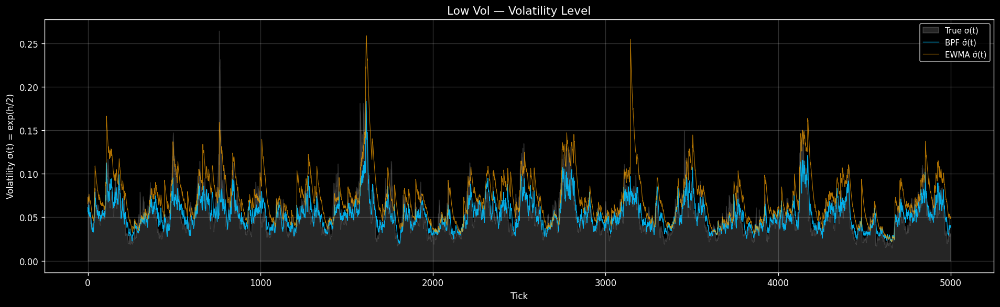

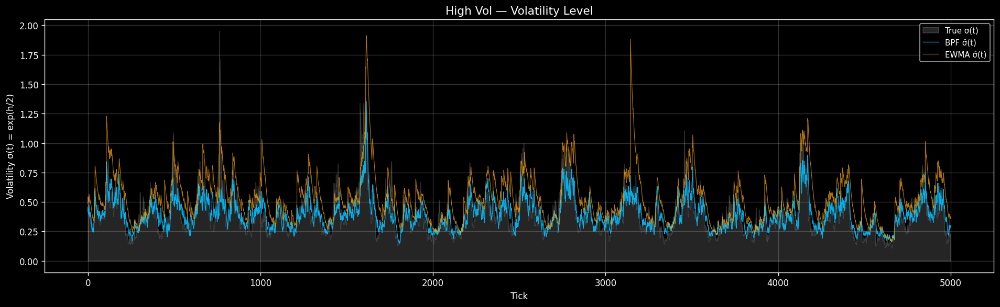

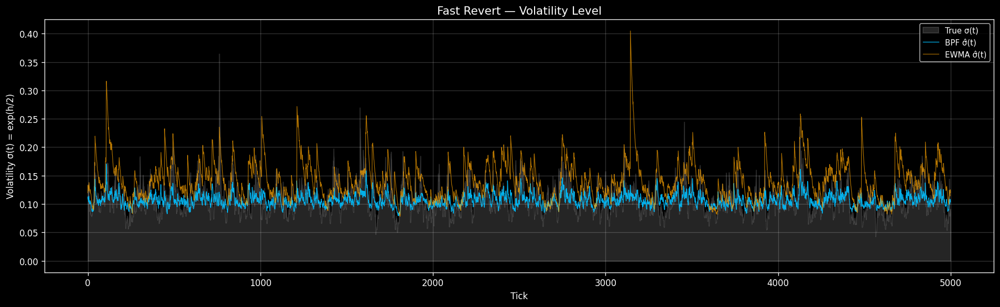

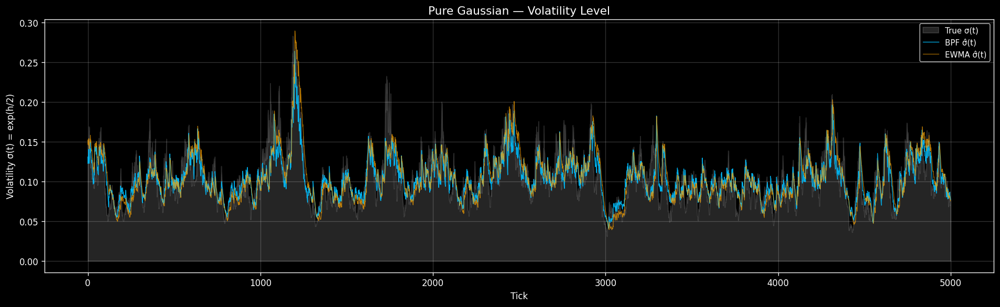

In [8]:
def plot_vol_surface(df, scenario_id=1):
    """True vol vs filtered vol (exp(h/2) space) — more intuitive."""
    d = df[df.scenario_id == scenario_id].copy()
    name = d.scenario_name.iloc[0]
    
    fig, ax = plt.subplots(figsize=(16, 5))
    ax.fill_between(d.tick, 0, d.true_vol, alpha=0.15, color='white', label='True σ(t)')
    ax.plot(d.tick, np.exp(d.bpf_h / 2), '#00bfff', lw=0.8, alpha=0.9, label='BPF σ̂(t)')
    ax.plot(d.tick, np.exp(d.ewma_h / 2), '#ffa500', lw=0.7, alpha=0.7, label='EWMA σ̂(t)')
    ax.set_ylabel('Volatility σ(t) = exp(h/2)')
    ax.set_xlabel('Tick')
    ax.set_title(f'{name} — Volatility Level', fontsize=13)
    ax.legend(fontsize=9)
    ax.grid(True, alpha=0.2)
    plt.tight_layout()

for sid in sorted(df.scenario_id.unique()):
    plot_vol_surface(df, scenario_id=sid)
    plt.show()